# 🛰️ Notebook 4: Geotiff of True color
This notebook introduces various ways to make **LULC** from STAC Data 

---

Let's start by searching for 3 months data over Auckland with cloud cover less than 10%

In [31]:
from pystac_client import Client

# Connect to a public catalog
catalog = Client.open('https://earth-search.aws.element84.com/v1')

# Intersects
area_of_interest =  {
        "coordinates": [
          [
            [
              73.58565553246652,
              19.96418875699311
            ],
            [
              73.83961839967523,
              19.96418875699311
            ],
            [
              73.83961839967523,
              20.083431822199188
            ],
            [
              73.58565553246652,
              20.083431822199188
            ],
            [
              73.58565553246652,
              19.96418875699311
            ]
          ]
        ],
        "type": "Polygon"
      }

time_range = "2023-01-01/2025-03-31"

search = catalog.search(
    collections=["sentinel-2-l2a"], 
    query={"eo:cloud_cover": {"lt": 10}},
    intersects=area_of_interest, 
    datetime=time_range
)
items = list(search.get_items())
print(f'Found {len(items)} items')

/Users/krishnaglodha/Documents/contri/foss4g-stac-ws/geoenv/lib/python3.12/site-packages/pystac_client/item_search.py:925: FutureWarning: get_items() is deprecated, use items() instead
  warnings.warn(


Found 162 items


Let's load this data using `odc-stac` 

In [32]:
from odc.stac import load
print('odc.stac available')


odc.stac available


In [33]:
ds = load(items, 
          groupby='solar_day', # Controls what items are placed in similar pixel plane
          resolution=10,
          chunks={'x':1024,'y':1024}, # Optional : Helpful to divide data in chunks for calculation
          geopolygon=area_of_interest,
          )
ds

<xarray.Dataset> Size: 37GB
Dimensions:       (y: 1342, x: 2668, time: 156)
Coordinates:
  * y             (y) float64 11kB 2.221e+06 2.221e+06 ... 2.208e+06 2.208e+06
  * x             (x) float64 21kB 3.52e+05 3.52e+05 ... 3.787e+05 3.787e+05
  * time          (time) datetime64[ns] 1kB 2023-01-02T05:53:21.569000 ... 20...
    spatial_ref   int32 4B 32643
Data variables: (12/38)
    aot           (time, y, x) uint16 1GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    blue          (time, y, x) uint16 1GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    cloud         (time, y, x) uint8 559MB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    coastal       (time, y, x) uint16 1GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    green         (time, y, x) uint16 1GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    nir           (time, y, x) uint16 1GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    ...            ...
    swir16-jp2    (time, y, x) uint16 1GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    swir22-jp2    (time, y, x) uint16 1GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    visual-jp2.1  (time, y, x) uint8 559MB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    visual-jp2.2  (time, y, x) uint8 559MB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    visual-jp2.3  (time, y, x) uint8 559MB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    wvp-jp2       (time, y, x) uint16 1GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>

In [34]:

import xarray as xr

da = xr.concat([ds["red"], ds["green"], ds["blue"]], dim="band")
da["band"] = ["red", "green", "blue"]


In [35]:
da

<xarray.DataArray 'red' (band: 3, time: 156, y: 1342, x: 2668)> Size: 3GB
dask.array<concatenate, shape=(3, 156, 1342, 2668), dtype=uint16, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates:
  * band         (band) <U5 60B 'red' 'green' 'blue'
  * time         (time) datetime64[ns] 1kB 2023-01-02T05:53:21.569000 ... 202...
  * y            (y) float64 11kB 2.221e+06 2.221e+06 ... 2.208e+06 2.208e+06
  * x            (x) float64 21kB 3.52e+05 3.52e+05 ... 3.787e+05 3.787e+05
    spatial_ref  int32 4B 32643
Attributes:
    nodata:   0

In [36]:
composites = da.resample(time="Q").median("time")
composites

/Users/krishnaglodha/Documents/contri/foss4g-stac-ws/geoenv/lib/python3.12/site-packages/xarray/groupers.py:530: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  self.index_grouper = pd.Grouper(


<xarray.DataArray 'red' (band: 3, time: 9, y: 1342, x: 2668)> Size: 773MB
dask.array<where, shape=(3, 9, 1342, 2668), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates:
  * band         (band) <U5 60B 'red' 'green' 'blue'
  * time         (time) datetime64[ns] 72B 2023-03-31 2023-06-30 ... 2025-03-31
  * y            (y) float64 11kB 2.221e+06 2.221e+06 ... 2.208e+06 2.208e+06
  * x            (x) float64 21kB 3.52e+05 3.52e+05 ... 3.787e+05 3.787e+05
    spatial_ref  int32 4B 32643
Attributes:
    nodata:   0

In [43]:
da = composites.transpose("time", "y", "x", "band")
da


<xarray.DataArray 'red' (time: 9, y: 1342, x: 2668, band: 3)> Size: 773MB
dask.array<transpose, shape=(9, 1342, 2668, 3), dtype=float64, chunksize=(1, 1024, 1024, 1), chunktype=numpy.ndarray>
Coordinates:
  * time         (time) datetime64[ns] 72B 2023-03-31 2023-06-30 ... 2025-03-31
  * y            (y) float64 11kB 2.221e+06 2.221e+06 ... 2.208e+06 2.208e+06
  * x            (x) float64 21kB 3.52e+05 3.52e+05 ... 3.787e+05 3.787e+05
  * band         (band) <U5 60B 'red' 'green' 'blue'
    spatial_ref  int32 4B 32643
Attributes:
    nodata:   0

In [42]:
import geogif
gif_img = geogif.dgif(da).compute()

ValueError: Array must have 1 or 3 bands, not 1342

In [46]:
rgb = composites.transpose("time", "band", "y", "x")

rgb.dims

('time', 'band', 'y', 'x')

In [51]:
import geogif
gif_img = geogif.dgif(rgb, fps=20).compute()



Aborting load due to failure while reading: https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/43/Q/CC/2023/1/S2A_43QCC_20230119_0_L2A/B03.tif:1


RasterioIOError: Read failed. See previous exception for details.

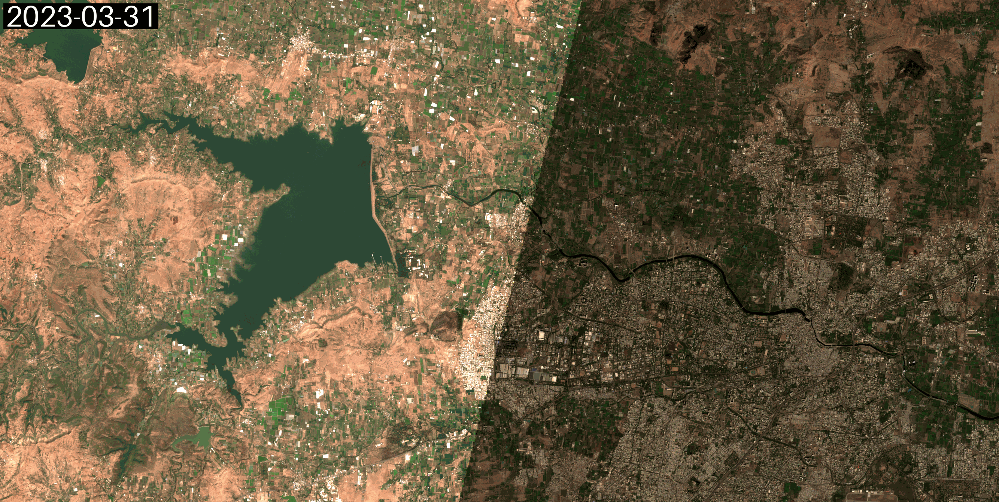

In [50]:
gif_img